In [1]:
import numpy as np
import plotly.graph_objects as go
from model_util_scannet_CIL_35 import ScannetDatasetConfig
import matplotlib.pyplot as plt
import os


In [2]:
temp_bbox_file = '/home/peisheng/votenet/40_cls_data/scannet/scannet_train_detection_data40/scene0000_00_bbox.npy'
temp_bbox = np.load(temp_bbox_file)
print(temp_bbox.shape)

stage_0_classes = [0,1,2,3,4,5,6]
nyu40ids = np.array([ 5, 8, 39, 23, 3, 7,  9, 18, 11, 29, 14, 15, 27, 6, 34, 21, 35, 4, 10, 16, 19, 37, 30, 12, 33, 32, 24, 25, 17, 28, 36, 26, 31, 20, 13])
nyu40id2class = {nyu40id: i for i,nyu40id in enumerate(list(nyu40ids))}
stage_0_nyu40ids = [nyu40ids[cls] for cls in stage_0_classes]
print(stage_0_nyu40ids)

# The last element if a bbox is the class id
# stage_0_bboxes are bboxes whose class id is in stage_0_classes
stage_0_bboxes = temp_bbox[np.isin(temp_bbox[:,-1], stage_0_nyu40ids)]
print(stage_0_bboxes.shape)

(67, 7)
[5, 8, 39, 23, 3, 7, 9]
(18, 7)


In [3]:
temp_bbox_file = '/home/peisheng/votenet/40_cls_data/scannet/scannet_train_detection_data40/scene0000_01_bbox.npy'
temp_bbox = np.load(temp_bbox_file)
print(temp_bbox.shape)

stage_0_classes = [0,1,2,3,4,5,6]
nyu40ids = np.array([ 5, 8, 39, 23, 3, 7,  9, 18, 11, 29, 14, 15, 27, 6, 34, 21, 35, 4, 10, 16, 19, 37, 30, 12, 33, 32, 24, 25, 17, 28, 36, 26, 31, 20, 13])
nyu40id2class = {nyu40id: i for i,nyu40id in enumerate(list(nyu40ids))}
stage_0_nyu40ids = [nyu40ids[cls] for cls in stage_0_classes]
print(stage_0_nyu40ids)

# The last element if a bbox is the class id
# stage_0_bboxes are bboxes whose class id is in stage_0_classes
stage_0_bboxes = temp_bbox[np.isin(temp_bbox[:,-1], stage_0_nyu40ids)]
print(stage_0_bboxes.shape)

(72, 7)
[5, 8, 39, 23, 3, 7, 9]
(19, 7)


In [4]:
train_25_file_path = '/home/peisheng/votenet/scannet/cls_7_obc/train_025.txt'
train_50_file_path = '/home/peisheng/votenet/scannet/cls_7_obc/train_050.txt'

def read_file(file_path):
    with open(file_path, 'r') as f:
        lines = f.readlines()
    lines = [line.strip() for line in lines]
    lines = [line.split(' ') for line in lines]
    lines = np.array(lines)
    return lines

train_25 = read_file(train_25_file_path)
train_50 = read_file(train_50_file_path)

type2class = {'chair':0, 'door':1, 'other furniture':2, 'books':3,
                    'cabinet':4, 'table':5, 'window':6, 'pillow':7,
                    'picture':8, 'box':9, 'desk':10, 'shelves':11, 'towel':12, 'sofa':13,
                    'sink':14, 'clothes':15, 'lamp':16, 'bed':17, 'bookshelf':18, 'curtain':19, 'mirror':20,
                    'bag':21, 'whiteboard':22, 'counter':23, 'toilet':24, 'nightstand':25, 'refrigerator':26,
                    'television':27, 'dresser':28, 'shower curtain':29, 'bathtub':30, 'paper':31, 'person':32,
                    'floor mat':33, 'blinds':34}
class2type = {type2class[t]:t for t in type2class}

# load object_reservoir from 'object_reservoir_35.pth'
with open('object_reservoir_35.pth', 'rb') as f:
    object_reservoir = np.load(f, allow_pickle=True)

train_num_obj_by_cls = [4357, 2026, 1985, 1554, 1427, 1271, 928, 745, 661, 657, 551, 486, 481, 406, 390, 386, 364, 307, 300, 292, 279, 253, 251, 216, 201, 190, 186, 177, 170, 116, 113, 52, 39, 32, 22]

In [5]:
print(sum(train_num_obj_by_cls[:7]))

13548


In [6]:
# convert train_25 to a list of tuples
train_25_list = []
for i in range(train_25.shape[0]):
    train_25_list.append((train_25[i][0], int(train_25[i][1]), int(train_25[i][2])))
print(len(train_25_list))

13525


In [8]:
# def get_class(scene_name, object_index, object_reservoir):
#     for obj in object_reservoir:
#         if obj['scene_name'] == scene_name and obj['object_id'] == object_index:
#             nyu_id = obj['nyu_id']
#             object_class = obj['object_class']
#             return object_class

# filter ther train_25_list and keep only tuples whose class is in stage_0_classes

# train_25_list = [t for t in train_25_list if get_class(t[0], t[1], object_reservoir) in stage_0_classes]
# print(len(train_25_list))
# sort the rain_25_list by the last element of each tuple in reverse order
train_25_list.sort(key=lambda x: x[2], reverse=True)
print(len(train_25_list))

13525


In [9]:
_index = 0
scene_name, object_index, obc_count = train_25_list[_index]
print(scene_name, object_index, obc_count)

# get the object point cloud from the reservoir
for obj in object_reservoir:
    if obj['scene_name'] == scene_name and obj['object_id'] == object_index:
        object_pc = obj['object_point_cloud']
        nyu_id = obj['nyu_id']
        object_class = obj['object_class']
        class_name = class2type[object_class]
        print(object_pc.shape, nyu_id, object_class, class_name)
        break
else:
    print('object not found')

scene0286_02 0 35
(1075, 6) 32 25 nightstand


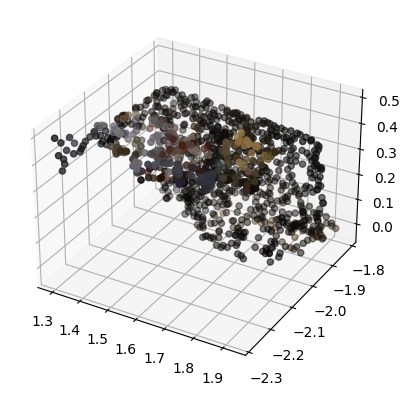

In [10]:
# use matplotlib to plot the object point cloud. The color is the third to fifth columns of the object point cloud
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(object_pc[:,0], object_pc[:,1], object_pc[:,2], c=object_pc[:,3:6]/255)
plt.show()



In [11]:
# load the point cloud 
folder = '/home/peisheng/votenet/40_cls_data/scannet/scannet_train_detection_data40'
point_cloud_file = os.path.join(folder, scene_name + '_vert.npy')
point_cloud = np.load(point_cloud_file)

# load the instance_bboxes
instance_bboxes_file = os.path.join(folder, scene_name + '_bbox.npy')
instance_bboxes = np.load(instance_bboxes_file)

# use plotly to visualize the point cloud and the bounding boxes
# for the points, the rgb values are stored in the last 3 columns
fig = go.Figure(data=[go.Scatter3d(x=point_cloud[:,0], y=point_cloud[:,1], z=point_cloud[:,2], mode='markers', marker=dict(size=1, color=point_cloud[:,3:6], opacity=0.8))])
# the bounding box format is [center_x, center_y, center_z, dx, dy, dz, nyu40_class]
# convert the bounding box to coordinates of the 8 corners and plot the bounding box
for index, bbox in enumerate(instance_bboxes):
    if index != object_index:
        continue
    center_x, center_y, center_z, dx, dy, dz, _ = bbox
    corners = np.array([[-1, -1, -1], [1, -1, -1], [1, 1, -1], [-1, 1, -1], [-1, -1, 1], [1, -1, 1], [1, 1, 1], [-1, 1, 1]]) * np.array([dx, dy, dz]) / 2
    corners = corners + np.array([center_x, center_y, center_z])
    # connect the corners
    lines = [[0, 1], [1, 2], [2, 3], [3, 0],
             [4, 5], [5, 6], [6, 7], [7, 4],
             [0, 4], [1, 5], [2, 6], [3, 7]]
    for line in lines:
        fig.add_trace(go.Scatter3d(x=[corners[line[0], 0], corners[line[1], 0]], 
                            y=[corners[line[0], 1], corners[line[1], 1]], 
                            z=[corners[line[0], 2], corners[line[1], 2]], 
                            mode='lines', 
                            line=dict(width=4, color='red')))  # Set the line width here

fig.show()
